In [1]:
### automatically refresh the buffer

%load_ext autoreload
%autoreload 2

### solve the auto-complete issue

%config Completer.use_jedi = False

%matplotlib inline

import warnings
warnings.filterwarnings('ignore')
warnings.simplefilter(action='ignore', category=FutureWarning)

### lvl 2 setups (systerm)

import os
import numpy as np
import pandas as pd
import xarray as xr

import matplotlib as mpl
import cartopy.crs as ccrs
import cartopy.feature as cfeature
import matplotlib.pyplot as plt
import cartopy.crs as ccrs

from cartopy.mpl.ticker import LongitudeFormatter, LatitudeFormatter
import warnings
warnings.filterwarnings('ignore')
from pylab import *
from matplotlib.colors import ListedColormap,LinearSegmentedColormap
from mpl_toolkits.axes_grid1.inset_locator import inset_axes
from matplotlib.patches import Wedge, Circle
import geopandas as gpd
from shapely.geometry import Point
from datetime import datetime
import datetime

In [2]:
clist1 =['#7cb3d4','#669dc7','#5185bb','#426cae','#3951a0','#303692',
        '#a60025','#bb1624','#d12927','#e14230','#ed5c3d','#f6774b',
        '#fa9359','#fdaf67','#fdc77c','#ffdc8f','#feeaa5','#fff8b7',
        '#f8fccd','#ebf7e4','#dcf1f7','#c4e6f0','#aadae8','#94c6de',]
red1 = LinearSegmentedColormap.from_list('chaos',clist1,N=24)
dpi_ = 100

In [3]:
gdf = gpd.read_file('../../tl_2019_us_state/tl_2019_us_state.shp')
US = gpd.read_file('../../tl_2019_us_state/tl_2019_us_state.shp')
output_folder = '/N/project/Zli_lab/gongg/CONUS404_data/LST/JJA/'

### prec_therhold maxp_maxp_hour

In [4]:
ds_the = xr.open_mfdataset(output_folder+'prec_the*.nc')
ds_maxp = xr.open_mfdataset(output_folder+'prec_maxp*.nc')
ds_maxh = xr.open_mfdataset(output_folder+'prec_maxh*.nc')

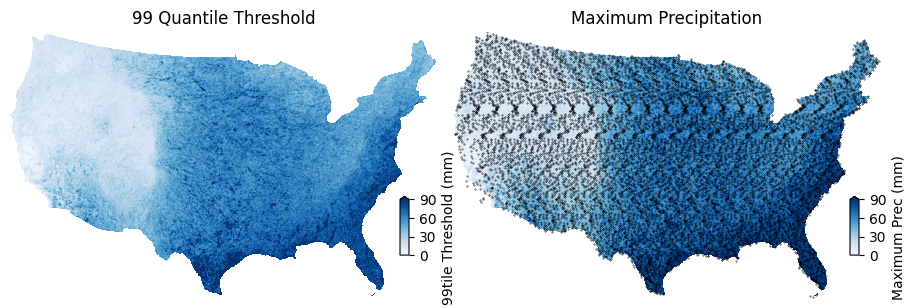

In [5]:
night_dot = np.flip(np.nanmax(ds_maxh.h.values,axis=0),axis=0)
night_dot[(night_dot >= 6) & (night_dot <= 17)] = np.nan
# Create a 1x2 grid of subplots
fig, ax = plt.subplots(1, 2, figsize=(9, 4.5), dpi=dpi_)

# First subplot
im1 = ax[0].imshow(np.flip(ds_the.p.values, axis=0), vmax=90, cmap='Blues')
ax[0].set_title('99 Quantile Threshold')

ax[0].axis('off')

# Add colorbar for the first subplot
cax1 = fig.add_axes([0.45, 0.3, 0.01, 0.13])
cbar1 = fig.colorbar(im1, cax=cax1, extend='max')
im1.set_clim(vmin=0.0, vmax=90)
cbar1.set_ticks([0, 30, 60, 90])
cbar1.set_label('99tile Threshold (mm)')

# Second subplot
im2 = ax[1].imshow(np.flip(np.nanmax(ds_maxp.p.values, axis=0), axis=0), vmax=90, cmap='Blues')
ax[1].set_title('Maximum Precipitation')

ax[1].axis('off')


cax2 = fig.add_axes([0.95, 0.3, 0.01, 0.13]) 
cbar2 = fig.colorbar(im2, cax=cax2, extend='max')
im2.set_clim(vmin=0.0, vmax=90)
cbar2.set_ticks([0, 30, 60, 90])
cbar2.set_label('Maximum Prec (mm)')

# ------------------dot indicate night time ------------------------------
y_indices, x_indices = np.indices(night_dot.shape)
ax[1].scatter(x_indices[~np.isnan(night_dot)][::50],
               y_indices[~np.isnan(night_dot)][::50], 
               color='k', 
               s=0.1)  

plt.tight_layout() 
plt.show()

### Extreme precipition values in different year

In [6]:
ds_season_mean = xr.open_mfdataset(output_folder+'season_mean_*.nc')

In [7]:
epv = ds_season_mean.p.values

In [8]:
arr_epv10 = np.nanmean(epv[:10], axis=(0,1))
arr_epv20 = np.nanmean(epv[10:20], axis=(0,1))
arr_epv30 = np.nanmean(epv[20:30], axis=(0,1))
arr_epv40 = np.nanmean(epv[30:40], axis=(0,1))
mask = np.isnan(np.nanmax(ds_maxp.p.values, axis=0))
arr_epv10[mask] = np.nan
arr_epv20[mask] = np.nan
arr_epv30[mask] = np.nan
arr_epv40[mask] = np.nan

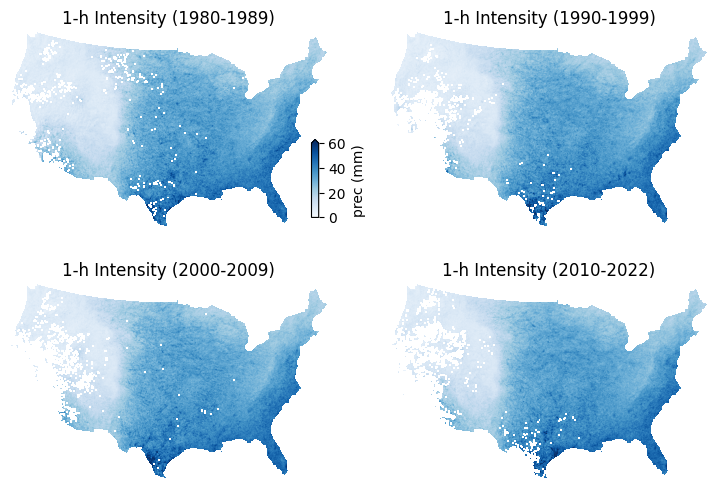

In [9]:
titles = ['1-h Intensity (1980-1989)', '1-h Intensity (1990-1999)', 
          '1-h Intensity (2000-2009)', '1-h Intensity (2010-2022)']

# Create a (2x2) subplot grid
fig, ax = plt.subplots(2, 2, figsize=(9, 6), dpi=dpi_)

# Plot each array in its respective subplot
arrays_ep = [arr_epv10, arr_epv20, arr_epv30, arr_epv40]
for i, axi in enumerate(ax.flat):
    im = axi.imshow(np.flip(arrays_ep[i], axis=0), vmax=60, cmap='Blues')
    axi.set_title(titles[i])
    axi.axis('off')

cax1 = fig.add_axes([0.46, 0.56, 0.008, 0.13])
cbar = fig.colorbar(im, cax=cax1, extend='max')

im.set_clim(vmin=0.0, vmax=60)
cbar.set_ticks([0, 20, 40 ,60])
cbar.set_label('prec (mm)')

plt.show()

#### 1-hour intensity of time slot

In [10]:
arr_epv0_6 = np.nanmean(epv[:,0:6,:,:], axis=(0,1))
arr_epv6_12 = np.nanmean(epv[:,6:12,:,:], axis=(0,1))
arr_epv12_18 = np.nanmean(epv[:,12:18,:,:], axis=(0,1))
arr_epv18_24 = np.nanmean(epv[:,18:24,:,:], axis=(0,1))
arr_epv6_18 = np.nanmean(epv[:,6:18,:,:], axis=(0,1))
arr_epv18_6 =  np.nanmean(np.concatenate((epv[:, 0:6, :, :], epv[:, 18:24, :, :]), axis=1), axis=(0, 1))
mask = np.isnan(np.nanmax(ds_maxp.p.values, axis=0))
arr_epv0_6[mask] = np.nan
arr_epv6_12[mask] = np.nan
arr_epv12_18[mask] = np.nan
arr_epv18_24[mask] = np.nan
arr_epv6_18[mask] = np.nan
arr_epv18_6[mask] = np.nan

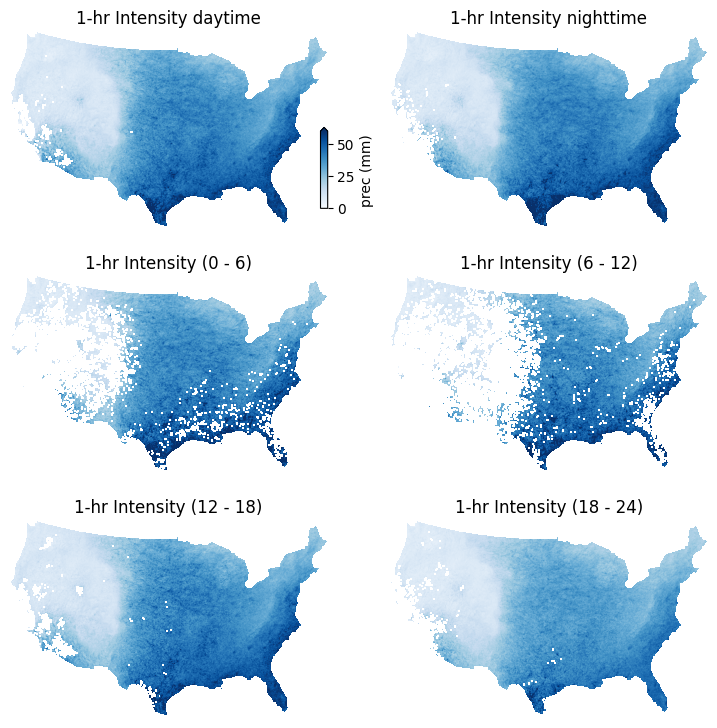

In [11]:
titles = [ '1-hr Intensity daytime', '1-hr Intensity nighttime', '1-hr Intensity (0 - 6)',
            '1-hr Intensity (6 - 12)', '1-hr Intensity (12 - 18)', '1-hr Intensity (18 - 24)']

# Create a (2x2) subplot grid
fig, ax = plt.subplots(3, 2, figsize=(9, 9), dpi=dpi_)

# Plot each array in its respective subplot
arrays_ep = [arr_epv6_18,arr_epv18_6,arr_epv0_6,arr_epv6_12, arr_epv12_18, arr_epv18_24, ]
for i, axi in enumerate(ax.flat):
    im = axi.imshow(np.flip(arrays_ep[i], axis=0), vmax=50, cmap='Blues')
    axi.set_title(titles[i])
    axi.axis('off')
cax1 = fig.add_axes([0.47, 0.68, 0.008, 0.09])
cbar = fig.colorbar(im, cax=cax1, extend='max')

im.set_clim(vmin=0.0, vmax=60)
cbar.set_ticks([0, 25 ,50])
cbar.set_label('prec (mm)')

plt.show()

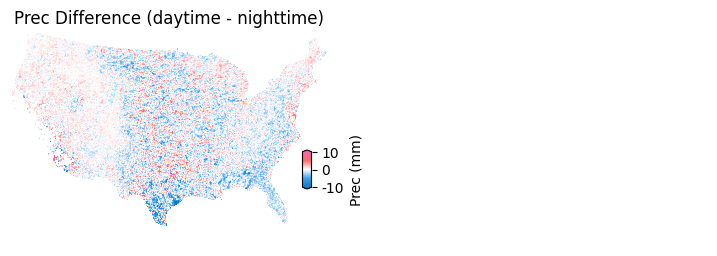

In [12]:
clist5=['#1079c3','#3d9fee','#ffffff','#ff6d6d','#f26ca7']
cmap5 = LinearSegmentedColormap.from_list('chaos',clist5)

arr_day_night = arr_epv6_18 - arr_epv18_6
fig, ax = plt.subplots(1, 2, figsize=(9, 3), dpi=dpi_)

# First subplot
im1 = ax[0].imshow(np.flip(arr_day_night, axis=0), vmax=10, vmin=-10, cmap=cmap5)
ax[0].set_title('Prec Difference (daytime - nighttime)')
ax[1].axis('off')
ax[0].axis('off')
# Add colorbar for the first subplot
cax1 = fig.add_axes([0.45, 0.3, 0.01, 0.13])
cbar1 = fig.colorbar(im1, cax=cax1, extend='both')
im1.set_clim(vmin=-10, vmax=10)
cbar1.set_ticks([-10, 0, 10])
cbar1.set_ticklabels(['-10', '0', '10'])
cbar1.set_label('Prec (mm)')

### Most frequent hour

In [13]:
ds_hour_count = xr.open_mfdataset(output_folder+'hour_count_*.nc')

In [14]:
hourc = ds_hour_count.c.values
arr_h10 = np.argmax(np.nansum(hourc[:10],axis=0), axis=0).astype(float)
arr_h20 = np.argmax(np.nansum(hourc[10:20],axis=0), axis=0).astype(float)
arr_h30 = np.argmax(np.nansum(hourc[20:30],axis=0), axis=0).astype(float)
arr_h40 = np.argmax(np.nansum(hourc[30:],axis=0), axis=0).astype(float)


mask1 = np.isnan(arr_epv10)
arr_h10[mask1] = np.nan
arr_h20[mask1] = np.nan
arr_h30[mask1] = np.nan
arr_h40[mask1] = np.nan

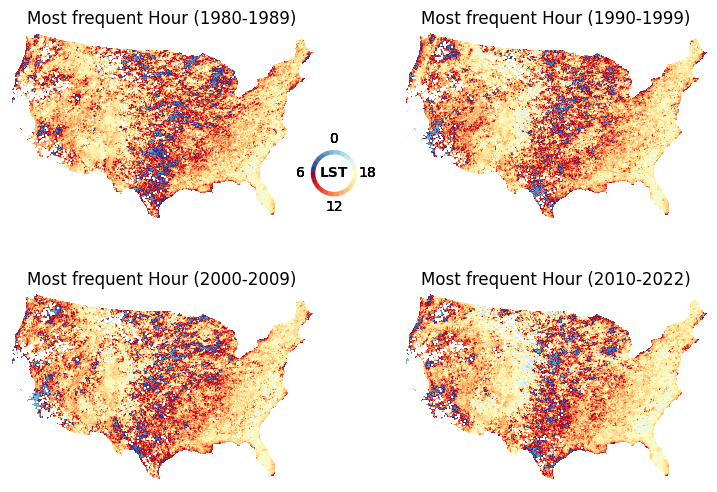

In [15]:
titles = ['Most frequent Hour (1980-1989)', 'Most frequent Hour (1990-1999)', 
          'Most frequent Hour (2000-2009)', 'Most frequent Hour (2010-2022)']

# Create a (2x2) subplot grid
fig, ax = plt.subplots(2, 2, figsize=(9, 6), dpi=dpi_)

# Plot each array in its respective subplot
arrays = [arr_h10, arr_h20, arr_h30, arr_h40]
for i, axi in enumerate(ax.flat):
    im = axi.imshow(np.flip(arrays[i], axis=0), cmap=red1)
    axi.set_title(titles[i])
    axi.axis('off')

# Only insert inset_ax in the first subplot
inset_ax = fig.add_axes([0.45, 0.59, 0.07, 0.09], zorder=3, frameon=False)  # Adjusted for first subplot location
rotation_angle = -90
n_segments = 24
theta = np.linspace(0, 2 * np.pi, n_segments + 1)

# Create wedges for the circular diagram
for i in range(n_segments):
    wedge = Wedge((0, 0), 1, np.degrees(theta[i]) - rotation_angle, np.degrees(theta[i+1]) - rotation_angle,
                  color=red1(i / (n_segments - 1)), edgecolor='none')
    inset_ax.add_patch(wedge)

# Add a white circle in the middle and set limits
inset_ax.add_patch(Circle((0, 0), 0.8, color='white', zorder=1))
inset_ax.set_xlim(-1.2, 1.2)
inset_ax.set_ylim(-1.2, 1.2)
inset_ax.set_xticks([])
inset_ax.set_yticks([])
inset_ax.set_aspect('equal')
inset_ax.text(0, 0, 'LST', ha='center', va='center', weight='bold')

step_value = 6   
angle_offset = -90

for spine in inset_ax.spines.values():
    spine.set_visible(False)
    for i in range(n_segments):
        if i % step_value == 0:
            # Reverse the direction without changing the starting position
            angle = -theta[i] - np.pi / 2 - np.radians(angle_offset)
            x, y = 1.5 * np.sin(angle), 1.5 * np.cos(angle)
            inset_ax.text(x, y, str(i), ha='center', va='center',)

fig.subplots_adjust(wspace=0.3, hspace=0.3)

plt.show()

### Circular Mean

In [16]:
def circular_array_mean(array, start, end):
    cm = np.empty((array.shape[2], array.shape[3]))

    summed_array = np.nansum(array[start:end], axis=0)

    time_angles = np.arange(24) * (360 / 24)
    sin_angles = np.sin(np.radians(time_angles))
    cos_angles = np.cos(np.radians(time_angles))

    for i in range(array.shape[2]):
        for j in range(array.shape[3]):

            weights = summed_array[:, i, j]
            weighted_sin = np.nansum(weights * sin_angles)
            weighted_cos = np.nansum(weights * cos_angles)
            mean_angle = np.arctan2(weighted_sin, weighted_cos) * (180 / np.pi)

            if mean_angle < 0:
                mean_angle += 360

            cm[i, j] = mean_angle * 24 / 360

    return cm

In [17]:
arr_cm10 = circular_array_mean(hourc, 0, 10)
arr_cm20 = circular_array_mean(hourc, 10, 20)
arr_cm30 = circular_array_mean(hourc, 20, 30)
arr_cm40 = circular_array_mean(hourc, 30, 43)

arr_cm10[mask1] = np.nan
arr_cm20[mask1] = np.nan
arr_cm30[mask1] = np.nan
arr_cm40[mask1] = np.nan

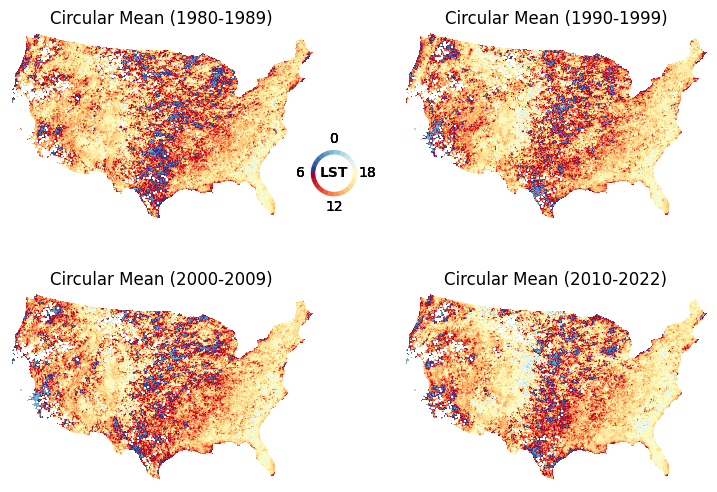

In [18]:
titles = ['Circular Mean (1980-1989)', 'Circular Mean (1990-1999)', 
          'Circular Mean (2000-2009)', 'Circular Mean (2010-2022)']

# Create a (2x2) subplot grid
fig, ax = plt.subplots(2, 2, figsize=(9, 6), dpi=dpi_)

# Plot each array in its respective subplot
arrayss = [arr_cm10, arr_cm20, arr_cm30, arr_cm40]
for i, axi in enumerate(ax.flat):
    im = axi.imshow(np.flip(arrays[i], axis=0), cmap=red1)
    axi.set_title(titles[i])
    axi.axis('off')

# Only insert inset_ax in the first subplot
inset_ax = fig.add_axes([0.45, 0.59, 0.07, 0.09], zorder=3, frameon=False)  # Adjusted for first subplot location
rotation_angle = -90
n_segments = 24
theta = np.linspace(0, 2 * np.pi, n_segments + 1)

# Create wedges for the circular diagram
for i in range(n_segments):
    wedge = Wedge((0, 0), 1, np.degrees(theta[i]) - rotation_angle, np.degrees(theta[i+1]) - rotation_angle,
                  color=red1(i / (n_segments - 1)), edgecolor='none')
    inset_ax.add_patch(wedge)

# Add a white circle in the middle and set limits
inset_ax.add_patch(Circle((0, 0), 0.8, color='white', zorder=1))
inset_ax.set_xlim(-1.2, 1.2)
inset_ax.set_ylim(-1.2, 1.2)
inset_ax.set_xticks([])
inset_ax.set_yticks([])
inset_ax.set_aspect('equal')
inset_ax.text(0, 0, 'LST', ha='center', va='center', weight='bold')

step_value = 6   
angle_offset = -90

for spine in inset_ax.spines.values():
    spine.set_visible(False)
    for i in range(n_segments):
        if i % step_value == 0:
            # Reverse the direction without changing the starting position
            angle = -theta[i] - np.pi / 2 - np.radians(angle_offset)
            x, y = 1.5 * np.sin(angle), 1.5 * np.cos(angle)
            inset_ax.text(x, y, str(i), ha='center', va='center',)

fig.subplots_adjust(wspace=0.3, hspace=0.3)

plt.show()

### Compare Frequency and Probability

In [19]:
ds_raster = xr.open_dataset('/N/project/Zli_lab/Data/Observations/NCAR/prec_acc_files/PREC_ACC_NC.wrf2d_d01_2022-09-30_23:00:00.nc')

In [20]:
lon = ds_raster['XLONG'].values
lat = ds_raster['XLAT'].values
grid = gpd.GeoDataFrame(
    geometry=gpd.points_from_xy(lon.flatten(), lat.flatten()),
    index=np.arange(lon.size)
)
grid.set_crs(gdf.crs, inplace=True)
grid_s = gpd.sjoin(grid, gdf, how='inner', predicate='within')

mask = np.full(ds_raster['PREC_ACC_NC'].shape[1:], False) 
for index in grid_s.index:
    row, col = np.unravel_index(index, mask.shape)  # 获取行列索引
    mask[row, col] = True
mask_da = xr.DataArray(mask, dims=ds_raster['PREC_ACC_NC'].dims[1:], coords={'south_north': ds_raster['PREC_ACC_NC'].coords['south_north'], 'west_east': ds_raster['PREC_ACC_NC'].coords['west_east']})
ds_conus = ds_raster.where(mask_da, drop=True)

In [21]:
XLON = ds_conus.XLONG.values[:707,:]
XLAT = ds_conus.XLAT.values[:707,:]
ds_hour_pdf = ds_hour_count.assign_coords({
    'XLON': (('lat', 'lon'), XLON),
    'XLAT': (('lat', 'lon'), XLAT)
})

In [22]:
regions_dict = {
    'NE': ['CT', 'DE', 'ME', 'MD', 'MA', 'NH', 'NJ', 'NY', 'PA', 'RI', 'VT', 'WV'],
    'Midwest': ['IA', 'MI', 'MN', 'WI', 'IL', 'IN', 'MO', 'OH'],
    'SE': ['AL', 'FL', 'GA', 'NC', 'SC', 'VA', 'TN', 'KY', 'AR', 'LA', 'MS'],
    'NGP': ['MT', 'NE', 'ND', 'SD', 'WY'],
    'SGP': ['KS', 'OK', 'TX'],
    'SW': ['AZ', 'CO', 'NM', 'UT', 'CA', 'NV'],
    'NW': ['ID', 'OR', 'WA']
}
regions = {name: US[US['STUSPS'].isin(states)] for name, states in regions_dict.items()}

In [23]:
regi = ['NE','Midwest','SE','NGP','SGP','SW','NW',]

In [24]:
ds_results = {}

for r in regi:
    lon = ds_hour_pdf['XLON'].values
    lat = ds_hour_pdf['XLAT'].values
    grid = gpd.GeoDataFrame(
        geometry=gpd.points_from_xy(lon.flatten(), lat.flatten()),
        index=np.arange(lon.size)
    )
    
    grid.set_crs(regions[r].crs, inplace=True)
    grid_s = gpd.sjoin(grid, regions[r], how='inner', predicate='within')

    mask = np.full((ds_hour_pdf['c'].shape[2], ds_hour_pdf['c'].shape[3]), False) 
    for index in grid_s.index:
        row, col = np.unravel_index(index, mask.shape)
        mask[row, col] = True

    mask_da = xr.DataArray(
        mask, 
        dims=['lat', 'lon'],
        coords={
            'lat': ds_hour_pdf['lat'].values,
            'lon': ds_hour_pdf['lon'].values
        }
    )

    ds_ssss = ds_hour_pdf.where(mask_da, drop=True)
    ds_results[f'ds_{r}'] = ds_ssss

In [25]:
regions = ['NE', 'Midwest', 'SE', 'NGP', 'SGP', 'SW', 'NW']
arr_results = {}

for region in regions:
    arr_results[f'arr_{region}_0_10'] = np.nansum(ds_results[f'ds_{region}'].c.values[0:10, :, :, :], axis=(0, 2, 3))
for region in regions:
    arr_results[f'arr_{region}_30_43'] = np.nansum(ds_results[f'ds_{region}'].c.values[30:40, :, :, :], axis=(0, 2, 3))


In [26]:
arr_before = [arr_results['arr_NE_0_10'],arr_results['arr_Midwest_0_10'],arr_results['arr_SE_0_10'],arr_results['arr_NGP_0_10'],arr_results['arr_SGP_0_10'],arr_results['arr_SW_0_10'],arr_results['arr_NW_0_10']]
arr_after = [arr_results['arr_NE_30_43'],arr_results['arr_Midwest_30_43'],arr_results['arr_SE_30_43'],arr_results['arr_NGP_30_43'],arr_results['arr_SGP_30_43'],arr_results['arr_SW_30_43'],arr_results['arr_NW_30_43']]

#### Frequency in different region

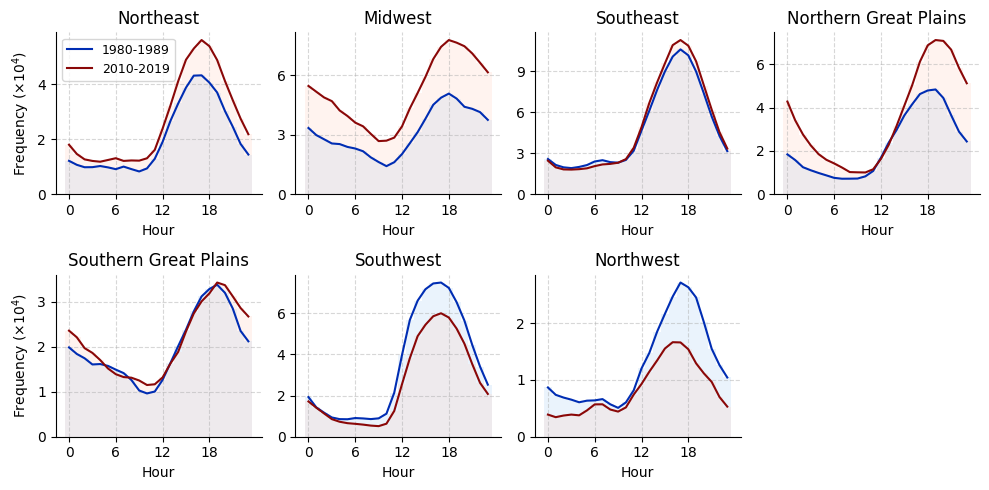

In [27]:
from matplotlib.ticker import MaxNLocator

regions_name = ['Northeast', 'Midwest', 'Southeast', 'Northern Great Plains', 'Southern Great Plains', 'Southwest', 'Northwest']
x = np.arange(0, 24)
fig, axes = plt.subplots(2, 4, figsize=(10, 5), dpi=dpi_)
axes = axes.flatten()

for i in range(7):
    axes[i].plot(x, arr_before[i] / 10000, label='1980-1989', color='#002db3')
    axes[i].plot(x, arr_after[i] / 10000, label='2010-2019', color='#8a0808')

    axes[i].bar(x, arr_before[i] / 10000, width=1, alpha=0.2, color='#99c7f2')
    axes[i].bar(x, arr_after[i] / 10000, width=1, alpha=0.2, color='#ffc6b3')

    axes[i].set_title(f'{regions_name[i]}')
    axes[i].set_xlabel('Hour')
    axes[i].set_xticks([0, 6, 12, 18])
    
    # Ensure y-ticks show at most 4 integer values
    axes[i].yaxis.set_major_locator(MaxNLocator(integer=True, nbins=4))

    axes[i].spines['top'].set_visible(False)
    axes[i].spines['right'].set_visible(False)
    axes[i].grid(True, ls='--', alpha=0.5)
    if i in [0, 4]:
        axes[i].set_ylabel('Frequency ($\\times10^4$)')

axes[0].legend(prop={'size': 9})
axes[7].axis('off')

plt.tight_layout()
plt.show()



In [28]:
regions = ['NE', 'Midwest', 'SE', 'NGP', 'SGP', 'SW', 'NW']
arr_results = {}

for region in regions:
    arr_results[f'arr_{region}_11'] = np.nansum(ds_results[f'ds_{region}'].c.values[3:13, :, :, :], axis=(0, 2, 3))
for region in regions:
    arr_results[f'arr_{region}_22'] = np.nansum(ds_results[f'ds_{region}'].c.values[13:23, :, :, :], axis=(0, 2, 3))
for region in regions:
    arr_results[f'arr_{region}_33'] = np.nansum(ds_results[f'ds_{region}'].c.values[23:33, :, :, :], axis=(0, 2, 3))
for region in regions:
    arr_results[f'arr_{region}_44'] = np.nansum(ds_results[f'ds_{region}'].c.values[33:43, :, :, :], axis=(0, 2, 3))

    
arr_11 = [arr_results['arr_NE_11'],arr_results['arr_Midwest_11'],arr_results['arr_SE_11'],arr_results['arr_NGP_11'],arr_results['arr_SGP_11'],arr_results['arr_SW_11'],arr_results['arr_NW_11']]
arr_22 = [arr_results['arr_NE_22'],arr_results['arr_Midwest_22'],arr_results['arr_SE_22'],arr_results['arr_NGP_22'],arr_results['arr_SGP_22'],arr_results['arr_SW_22'],arr_results['arr_NW_22']]
arr_33 = [arr_results['arr_NE_33'],arr_results['arr_Midwest_33'],arr_results['arr_SE_33'],arr_results['arr_NGP_33'],arr_results['arr_SGP_33'],arr_results['arr_SW_33'],arr_results['arr_NW_33']]
arr_44 = [arr_results['arr_NE_44'],arr_results['arr_Midwest_44'],arr_results['arr_SE_44'],arr_results['arr_NGP_44'],arr_results['arr_SGP_44'],arr_results['arr_SW_44'],arr_results['arr_NW_44']]

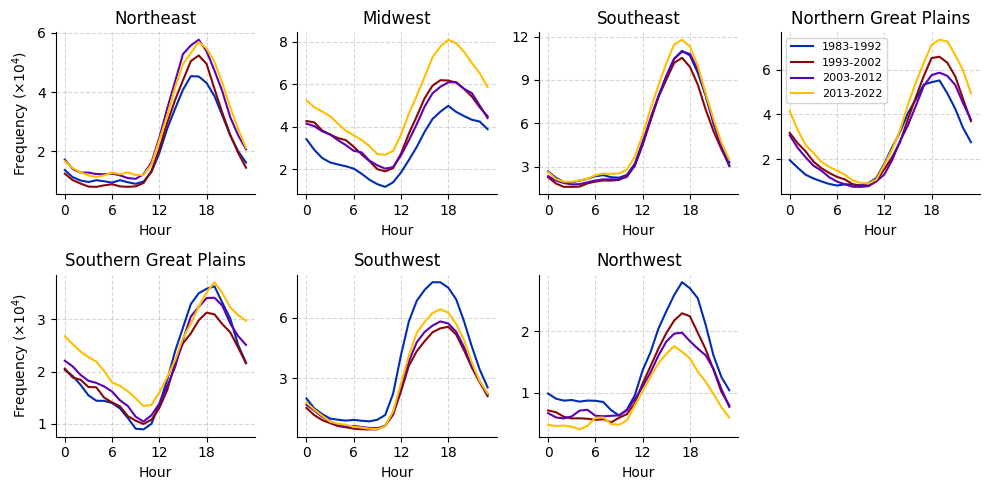

In [29]:

regions_name = ['Northeast', 'Midwest', 'Southeast', 'Northern Great Plains', 'Southern Great Plains', 'Southwest', 'Northwest']
x = np.arange(0, 24)
fig, axes = plt.subplots(2, 4, figsize=(10, 5), dpi=dpi_)
axes = axes.flatten()

for i in range(7):
    axes[i].plot(x, arr_11[i] / 10000, label='1983-1992', color='#002db3')
    axes[i].plot(x, arr_22[i] / 10000, label='1993-2002', color='#8a0808')
    axes[i].plot(x, arr_33[i] / 10000, label='2003-2012', color='#5d01b2')
    axes[i].plot(x, arr_44[i] / 10000, label='2013-2022', color='#ffbf00')
    
    # axes[i].bar(x, arr_11[i] / 10000, width=1, alpha=0.2, color='#99c7f2')
    # axes[i].bar(x, arr_22[i] / 10000, width=1, alpha=0.2, color='#ffc6b3')
    # axes[i].bar(x, arr_33[i] / 10000, width=1, alpha=0.2, color='#f1e6fc')
    # axes[i].bar(x, arr_44[i] / 10000, width=1, alpha=0.2, color='#feffea')

    axes[i].set_title(f'{regions_name[i]}')
    axes[i].set_xlabel('Hour')
    axes[i].set_xticks([0, 6, 12, 18])
    
    # Ensure y-ticks show at most 4 integer values
    axes[i].yaxis.set_major_locator(MaxNLocator(integer=True, nbins=4))

    axes[i].spines['top'].set_visible(False)
    axes[i].spines['right'].set_visible(False)
    axes[i].grid(True, ls='--', alpha=0.5)
    if i in [0, 4]:
        axes[i].set_ylabel('Frequency ($\\times10^4$)')

axes[3].legend(prop={'size': 8})
axes[7].axis('off')

plt.tight_layout()
plt.show()

#### Probability in different region

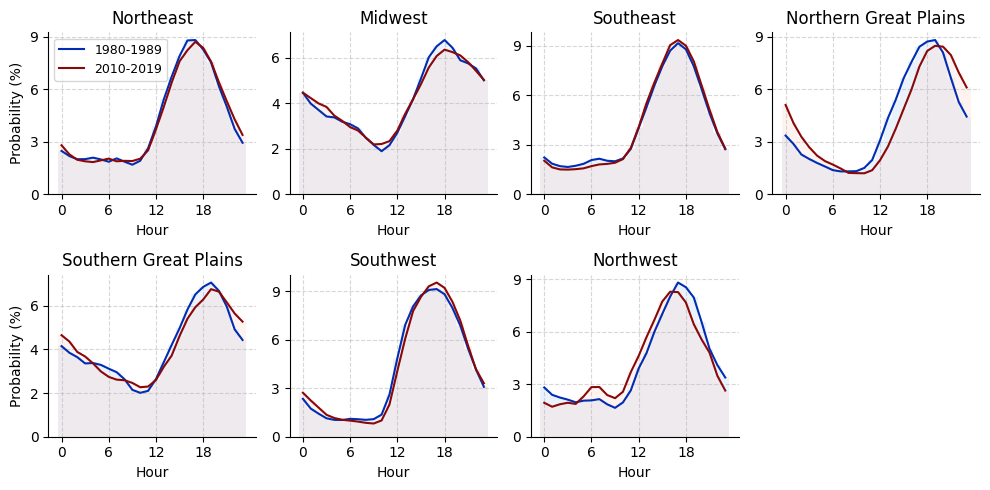

In [30]:
from matplotlib.ticker import MaxNLocator

regions_name = ['Northeast', 'Midwest', 'Southeast', 'Northern Great Plains', 'Southern Great Plains', 'Southwest', 'Northwest']
x = np.arange(0, 24)
fig, axes = plt.subplots(2, 4, figsize=(10, 5), dpi=dpi_)
axes = axes.flatten()

for i in range(7):
    axes[i].plot(x, (arr_before[i] / arr_before[i].sum())*100, label='1980-1989', color='#002db3')
    axes[i].plot(x, (arr_after[i] / arr_after[i].sum())*100, label='2010-2019', color='#8a0808')

    axes[i].bar(x, (arr_before[i] / arr_before[i].sum())*100, width=1, alpha=0.2, color='#99c7f2')
    axes[i].bar(x, (arr_after[i] / arr_after[i].sum())*100, width=1, alpha=0.2, color='#ffc6b3')

    axes[i].set_title(f'{regions_name[i]}')
    axes[i].set_xlabel('Hour')
    axes[i].set_xticks([0, 6, 12, 18])
    
    # Ensure y-ticks show at most 4 integer values
    axes[i].yaxis.set_major_locator(MaxNLocator(integer=True, nbins=4))

    axes[i].spines['top'].set_visible(False)
    axes[i].spines['right'].set_visible(False)
    axes[i].grid(True, ls='--', alpha=0.5)

    if i in [0, 4]:
        axes[i].set_ylabel('Probability (%)')

axes[0].legend(prop={'size': 9})
axes[7].axis('off')

plt.tight_layout()
plt.show()

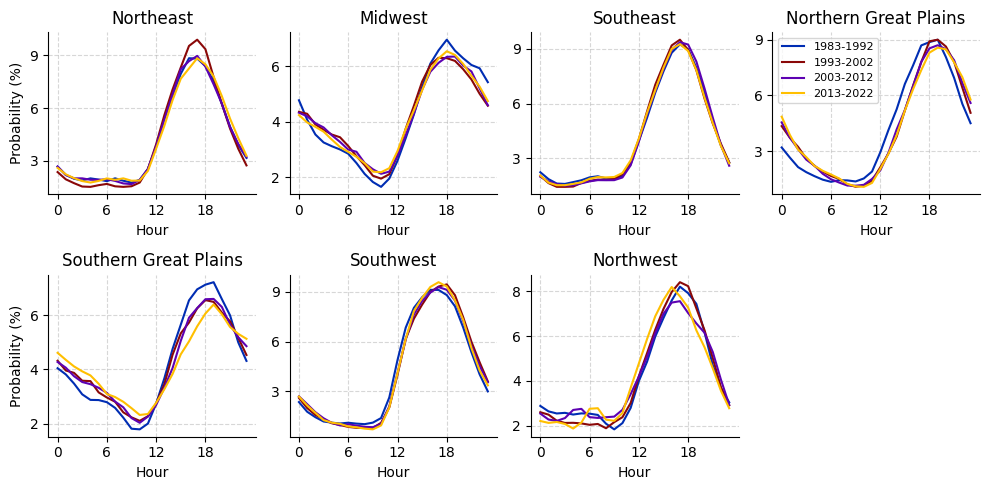

In [31]:
regions_name = ['Northeast', 'Midwest', 'Southeast', 'Northern Great Plains', 'Southern Great Plains', 'Southwest', 'Northwest']
x = np.arange(0, 24)
fig, axes = plt.subplots(2, 4, figsize=(10, 5), dpi=dpi_)
axes = axes.flatten()

for i in range(7):
    axes[i].plot(x, (arr_11[i] / arr_11[i].sum())*100, label='1983-1992', color='#002db3')
    axes[i].plot(x, (arr_22[i] / arr_22[i].sum())*100, label='1993-2002', color='#8a0808')
    axes[i].plot(x, (arr_33[i] / arr_33[i].sum())*100, label='2003-2012', color='#5d01b2')
    axes[i].plot(x, (arr_44[i] / arr_44[i].sum())*100, label='2013-2022', color='#ffbf00')

    # axes[i].bar(x, (arr_before[i] / arr_before[i].sum())*100, width=1, alpha=0.2, color='#99c7f2')
    # axes[i].bar(x, (arr_after[i] / arr_after[i].sum())*100, width=1, alpha=0.2, color='#ffc6b3')

    axes[i].set_title(f'{regions_name[i]}')
    axes[i].set_xlabel('Hour')
    axes[i].set_xticks([0, 6, 12, 18])
    
    # Ensure y-ticks show at most 4 integer values
    axes[i].yaxis.set_major_locator(MaxNLocator(integer=True, nbins=4))

    axes[i].spines['top'].set_visible(False)
    axes[i].spines['right'].set_visible(False)
    axes[i].grid(True, ls='--', alpha=0.5)

    if i in [0, 4]:
        axes[i].set_ylabel('Probability (%)')

axes[3].legend(prop={'size': 8})
axes[7].axis('off')

plt.tight_layout()
plt.show()

#### Intensity in different region

In [32]:
XLON = ds_conus.XLONG.values[:707,:]
XLAT = ds_conus.XLAT.values[:707,:]
ds_prec_pdf = ds_season_mean.assign_coords({
    'XLON': (('lat', 'lon'), XLON),
    'XLAT': (('lat', 'lon'), XLAT)
})

In [33]:
regions_dict = {
    'NE': ['CT', 'DE', 'ME', 'MD', 'MA', 'NH', 'NJ', 'NY', 'PA', 'RI', 'VT', 'WV'],
    'Midwest': ['IA', 'MI', 'MN', 'WI', 'IL', 'IN', 'MO', 'OH'],
    'SE': ['AL', 'FL', 'GA', 'NC', 'SC', 'VA', 'TN', 'KY', 'AR', 'LA', 'MS'],
    'NGP': ['MT', 'NE', 'ND', 'SD', 'WY'],
    'SGP': ['KS', 'OK', 'TX'],
    'SW': ['AZ', 'CO', 'NM', 'UT', 'CA', 'NV'],
    'NW': ['ID', 'OR', 'WA']
}
regions = {name: US[US['STUSPS'].isin(states)] for name, states in regions_dict.items()}

In [34]:
ds_results = {}

for r in regi:
    lon = ds_prec_pdf['XLON'].values
    lat = ds_prec_pdf['XLAT'].values
    grid = gpd.GeoDataFrame(
        geometry=gpd.points_from_xy(lon.flatten(), lat.flatten()),
        index=np.arange(lon.size)
    )
    
    grid.set_crs(regions[r].crs, inplace=True)
    grid_s = gpd.sjoin(grid, regions[r], how='inner', predicate='within')

    mask = np.full((ds_prec_pdf['p'].shape[2], ds_prec_pdf['p'].shape[3]), False) 
    for index in grid_s.index:
        row, col = np.unravel_index(index, mask.shape)
        mask[row, col] = True

    mask_da = xr.DataArray(
        mask, 
        dims=['lat', 'lon'],
        coords={
            'lat': ds_prec_pdf['lat'].values,
            'lon': ds_prec_pdf['lon'].values
        }
    )

    ds_ssss = ds_prec_pdf.where(mask_da, drop=True)
    ds_results[f'ds_{r}'] = ds_ssss

In [35]:
regions = ['NE', 'Midwest', 'SE', 'NGP', 'SGP', 'SW', 'NW']
arrp_results = {}

for region in regions:
    arrp_results[f'arrp_{region}_0_10'] = np.nanmean(ds_results[f'ds_{region}'].p.values[0:10, :, :, :], axis=(0, 2, 3))
for region in regions:
    arrp_results[f'arrp_{region}_30_43'] = np.nanmean(ds_results[f'ds_{region}'].p.values[30:40, :, :, :], axis=(0, 2, 3))

In [36]:
arrp_before = [arrp_results['arrp_NE_0_10'],arrp_results['arrp_Midwest_0_10'],arrp_results['arrp_SE_0_10'],arrp_results['arrp_NGP_0_10'],arrp_results['arrp_SGP_0_10'],arrp_results['arrp_SW_0_10'],arrp_results['arrp_NW_0_10']]
arrp_after = [arrp_results['arrp_NE_30_43'],arrp_results['arrp_Midwest_30_43'],arrp_results['arrp_SE_30_43'],arrp_results['arrp_NGP_30_43'],arrp_results['arrp_SGP_30_43'],arrp_results['arrp_SW_30_43'],arrp_results['arrp_NW_30_43']]

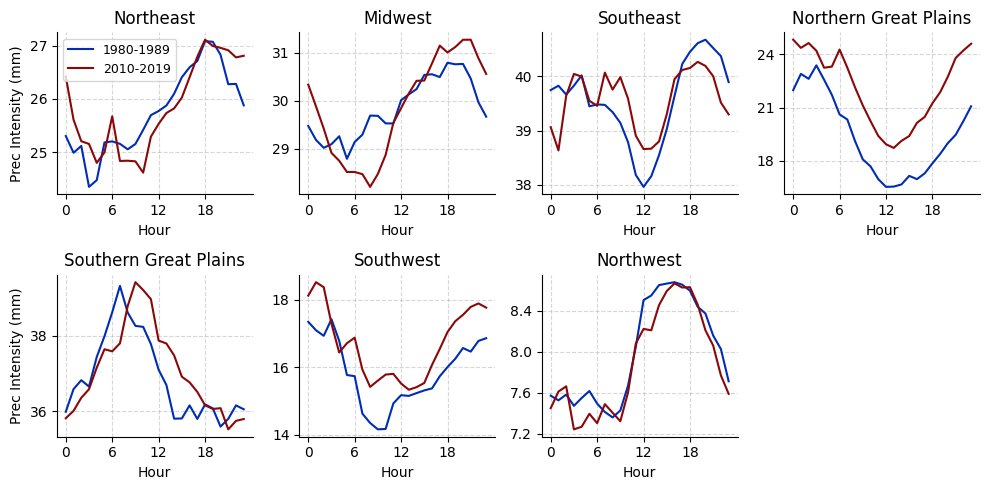

In [37]:
from matplotlib.ticker import MaxNLocator

regions_name = ['Northeast', 'Midwest', 'Southeast', 'Northern Great Plains', 'Southern Great Plains', 'Southwest', 'Northwest']
x = np.arange(0, 24)
fig, axes = plt.subplots(2, 4, figsize=(10, 5), dpi=dpi_)
axes = axes.flatten()

for i in range(7):
    axes[i].plot(x, arrp_before[i], label='1980-1989', color='#002db3')
    axes[i].plot(x, arrp_after[i], label='2010-2019', color='#8a0808')

    # axes[i].bar(x, arrp_before[i], width=1, alpha=0.2, color='#99c7f2')
    # axes[i].bar(x, arrp_after[i], width=1, alpha=0.2, color='#ffc6b3')

    axes[i].set_title(f'{regions_name[i]}')
    axes[i].set_xlabel('Hour')
    axes[i].set_xticks([0, 6, 12, 18])
    
    # Ensure y-ticks show at most 4 integer values
    axes[i].yaxis.set_major_locator(MaxNLocator(integer=True, nbins=4))

    axes[i].spines['top'].set_visible(False)
    axes[i].spines['right'].set_visible(False)
    axes[i].grid(True, ls='--', alpha=0.5)
    if i in [0, 4]:
        axes[i].set_ylabel('Prec Intensity (mm)')

axes[0].legend(prop={'size': 9})
axes[7].axis('off')

plt.tight_layout()
plt.show()


In [38]:
regions = ['NE', 'Midwest', 'SE', 'NGP', 'SGP', 'SW', 'NW']
arrp_results = {}

for region in regions:
    arrp_results[f'arrp_{region}_11'] = np.nanmean(ds_results[f'ds_{region}'].p.values[3:13, :, :, :], axis=(0, 2, 3))
for region in regions:
    arrp_results[f'arrp_{region}_22'] = np.nanmean(ds_results[f'ds_{region}'].p.values[13:23, :, :, :], axis=(0, 2, 3))
for region in regions:
    arrp_results[f'arrp_{region}_33'] = np.nanmean(ds_results[f'ds_{region}'].p.values[23:33, :, :, :], axis=(0, 2, 3))
for region in regions:
    arrp_results[f'arrp_{region}_44'] = np.nanmean(ds_results[f'ds_{region}'].p.values[33:43, :, :, :], axis=(0, 2, 3))

    
arrp_11 = [arrp_results['arrp_NE_11'],arrp_results['arrp_Midwest_11'],arrp_results['arrp_SE_11'],arrp_results['arrp_NGP_11'],arrp_results['arrp_SGP_11'],arrp_results['arrp_SW_11'],arrp_results['arrp_NW_11']]
arrp_22 = [arrp_results['arrp_NE_22'],arrp_results['arrp_Midwest_22'],arrp_results['arrp_SE_22'],arrp_results['arrp_NGP_22'],arrp_results['arrp_SGP_22'],arrp_results['arrp_SW_22'],arrp_results['arrp_NW_22']]
arrp_33 = [arrp_results['arrp_NE_33'],arrp_results['arrp_Midwest_33'],arrp_results['arrp_SE_33'],arrp_results['arrp_NGP_33'],arrp_results['arrp_SGP_33'],arrp_results['arrp_SW_33'],arrp_results['arrp_NW_33']]
arrp_44 = [arrp_results['arrp_NE_44'],arrp_results['arrp_Midwest_44'],arrp_results['arrp_SE_44'],arrp_results['arrp_NGP_44'],arrp_results['arrp_SGP_44'],arrp_results['arrp_SW_44'],arrp_results['arrp_NW_44']]

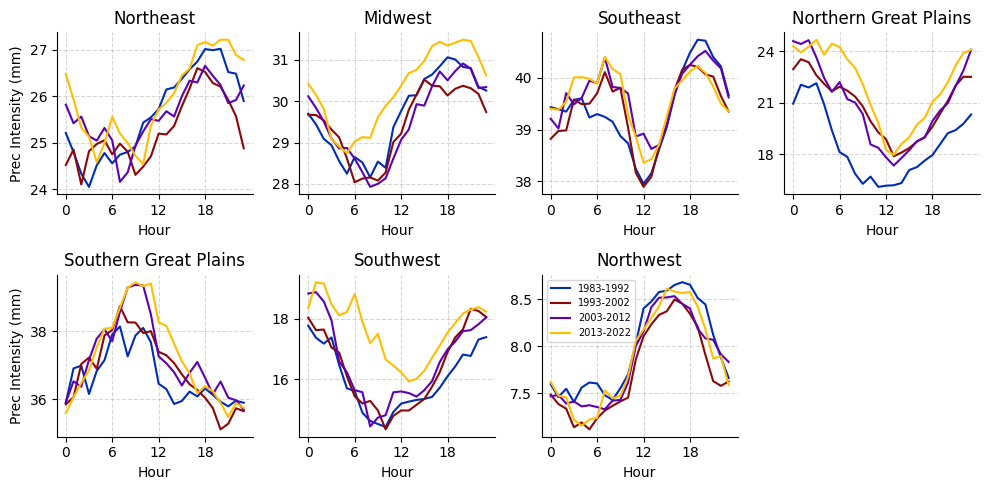

In [39]:

regions_name = ['Northeast', 'Midwest', 'Southeast', 'Northern Great Plains', 'Southern Great Plains', 'Southwest', 'Northwest']
x = np.arange(0, 24)
fig, axes = plt.subplots(2, 4, figsize=(10, 5), dpi=dpi_)
axes = axes.flatten()

for i in range(7):
    axes[i].plot(x, arrp_11[i], label='1983-1992', color='#002db3')
    axes[i].plot(x, arrp_22[i], label='1993-2002', color='#8a0808')
    axes[i].plot(x, arrp_33[i], label='2003-2012', color='#5d01b2')
    axes[i].plot(x, arrp_44[i], label='2013-2022', color='#ffbf00')


    axes[i].set_title(f'{regions_name[i]}')
    axes[i].set_xlabel('Hour')
    axes[i].set_xticks([0, 6, 12, 18])
    
    # Ensure y-ticks show at most 4 integer values
    axes[i].yaxis.set_major_locator(MaxNLocator(integer=True, nbins=4))

    axes[i].spines['top'].set_visible(False)
    axes[i].spines['right'].set_visible(False)
    axes[i].grid(True, ls='--', alpha=0.5)
    if i in [0, 4]:
        axes[i].set_ylabel('Prec Intensity (mm)')

axes[6].legend(prop={'size': 7})
axes[7].axis('off')

plt.tight_layout()
plt.show()

## -----------------Trend--------------

#### ---------------Trend of Intensity---------------

### Trend of daytime and nighttime 

In [45]:
clist1=['#035a96','#1079c3','#3d9fee','#ffffff','#ff6d6d','#f26ca7','#920efc']
cmap1 = LinearSegmentedColormap.from_list('chaos',clist1)
clist2=['#002db3','#f3f3f3','#8a0808']
cmap2 = ListedColormap(clist2)

In [48]:
import pymannkendall as mk
from scipy.stats import linregress
from scipy import stats

In [41]:
arr_ntt = np.nanmean(np.concatenate((epv[:, 0:6, :, :], epv[:, 18:24, :, :]), axis=1), axis=1)
arr_dyt = np.nanmean(np.concatenate((epv[:, 6:12, :, :], epv[:, 12:18, :, :]), axis=1), axis=1)


hourc = ds_hour_count.c.values

arr_h_ntt = np.nansum(hourc[:,0:6,:,:],axis=1).astype(float) + np.nansum(hourc[:,18:24,:,:],axis=1).astype(float)
arr_h_dyt =  np.nansum(hourc[:,6:12,:,:],axis=1).astype(float) + np.nansum(hourc[:,12:18,:,:],axis=1).astype(float)

mask = np.isnan(np.nanmax(ds_maxp.p.values, axis=0))
mask_reshaped = np.repeat(mask[np.newaxis, :, :], 43, axis=0)

arr_h_ntt[mask_reshaped] = np.nan
arr_h_dyt[mask_reshaped] = np.nan

In [42]:
import numpy as np
import pymannkendall as mk  # Make sure you have the pymannkendall library

# Create a list of the arrays to process
arrays = {
    'nt_int': arr_ntt,
    'dt_int': arr_dyt,
    'nt_freq': arr_h_ntt,
    'dt_freq': arr_h_dyt,
}

# Initialize dictionaries to store results
arr_trends = {}
arr_pvalues = {}
arr_slopes = {}

# Loop through each array in the dictionary
for key, arr in arrays.items():
    # Create empty arrays to store the results for each key
    arr_trends[key] = np.empty((arr.shape[1], arr.shape[2]), dtype=object)  # For trend results
    arr_pvalues[key] = np.em  pty((arr.shape[1], arr.shape[2]))  # For p-values
    arr_slopes[key] = np.empty((arr.shape[1], arr.shape[2]))  # For slopes
    
    for i in range(arr.shape[1]):
        for j in range(arr.shape[2]):
            # Remove NaN values
            mask = ~np.isnan(arr[:, i, j])
            y_clean = arr[:, i, j][mask]
            
            # Perform Mann-Kendall test if there's enough data
            if len(y_clean) > 1:  # At least two data points are needed for the test
                result = mk.original_test(y_clean)
                trend = result.trend
                p_value = result.p
                slope = result.slope
            else:
                trend, p_value, slope = np.nan, np.nan, np.nan  # Set to NaN if insufficient data
            
            # Store the results in the respective arrays
            arr_trends[key][i, j] = trend
            arr_pvalues[key][i, j] = p_value
            arr_slopes[key][i, j] = slope


In [43]:
# Initialize a dictionary to store the replaced arrays with float dtype
arr_tr_replaced = {}

# Loop through each key in the arr_trends dictionary
for key in arr_trends.keys():
    # Replace 'no trend' with 0.0, 'increasing' with 1.0, and 'decreasing' with -1.0
    arr_tr_replaced[key] = np.where(arr_trends[key] == 'no trend', 0.0,
                                     np.where(arr_trends[key] == 'increasing', 1.0,
                                              np.where(arr_trends[key] == 'decreasing', -1.0, arr_trends[key]))).astype(float)



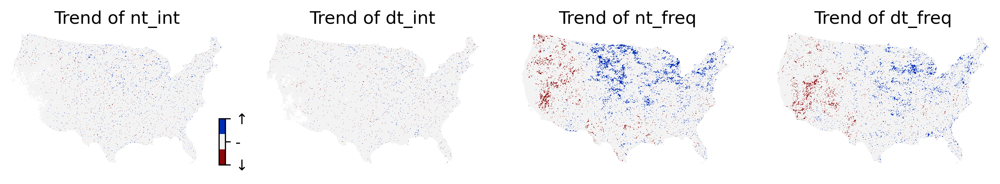

In [48]:
import matplotlib.patches as patches
titles = [ 'Trend of nt_int', 'Trend of dt_int', 'Trend of nt_freq', 'Trend of dt_freq',]

fig, ax = plt.subplots(1, 4, figsize=(12, 2), dpi=300)

# Plot each array in its respective subplot
arrays_trend = [arr_tr_replaced['nt_int'], arr_tr_replaced['dt_int'], arr_tr_replaced['nt_freq'], arr_tr_replaced['dt_freq'], ]
for i, axi in enumerate(ax.flat):
    im = axi.imshow(np.flip(arrays_trend[i], axis=0), cmap=cmap2.reversed())
    axi.set_title(titles[i])
    axi.set_xticks([])
    axi.set_yticks([])
    axi.spines['top'].set_visible(False)
    axi.spines['bottom'].set_visible(False)
    axi.spines['left'].set_visible(False)
    axi.spines['right'].set_visible(False)
        # Add a single set of colored circles to each subplot

cax1 = fig.add_axes([0.29, 0.18, 0.005, 0.22])
cbar = fig.colorbar(im, cax=cax1, )

im.set_clim(vmin=-1, vmax=1)
cbar.set_ticks([-1, 0, 1])
cbar.set_ticklabels(['↓', '-', '↑'])
cbar.set_label('')

plt.show()

In [51]:
arrays_pvalues = [arr_pvalues['nt_int'], arr_pvalues['dt_int'], arr_pvalues['nt_freq'], arr_pvalues['dt_freq']]

# Create an empty list to store the modified arrays
arr_p05 = []

# Loop through each array in arrays_ep_pvalues
for arr in arrays_pvalues:
    # Use np.where to replace values greater than 0.05 with np.nan
    modified_arr = np.where(arr > 0.05, np.nan, arr)
    arr_p05.append(modified_arr)  # Append the modified array to the new list

# If you want to convert it back to a dictionary, you can use this:
arr_p05_dict = {
    'nt_int': arr_p05[0],
    'dt_int': arr_p05[1],
    'nt_freq': arr_p05[2],
    'dt_freq': arr_p05[3],
}

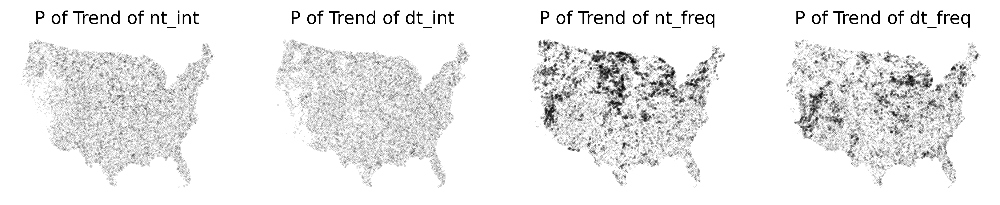

In [54]:
titles = [ 'P of Trend of nt_int', 'P of Trend of dt_int','P of Trend of nt_freq','P of Trend of dt_freq',]

fig, ax = plt.subplots(1, 4, figsize=(12, 2), dpi=500)

# Plot each array in its respective subplot
arrays_pvalues = [arr_p05_dict['nt_int'], arr_p05_dict['dt_int'], arr_p05_dict['nt_freq'], arr_p05_dict['dt_freq'], ]
for i, axi in enumerate(ax.flat):
    y, x = np.where(~np.isnan(arrays_pvalues[i]))
    im = axi.scatter(x, y, s=0.0005, color='k')
    axi.set_title(titles[i])
    axi.set_xticks([])
    axi.set_yticks([])
    axi.spines['top'].set_visible(False)
    axi.spines['bottom'].set_visible(False)
    axi.spines['left'].set_visible(False)
    axi.spines['right'].set_visible(False)

plt.show()

### Trend of different time slot

In [269]:
ep_ytotal = np.nanmean(epv,axis=1)
arr_y06 = np.nanmean(epv[:,0:6,:,:], axis=1)
arr_y612 = np.nanmean(epv[:,6:12,:,:], axis=1)
arr_y1218 = np.nanmean(epv[:,12:18,:,:], axis=1)
arr_y180 = np.nanmean(epv[:,18:24,:,:], axis=1)

In [271]:
import numpy as np
import pymannkendall as mk  # Make sure you have the pymannkendall library

# Create a list of the arrays to process
arrays = {
    'total': ep_ytotal,
    '06': arr_y06,
    '612': arr_y612,
    '1218': arr_y1218,
    '180': arr_y180
}

# Initialize dictionaries to store results
arr_trends = {}
arr_pvalues = {}
arr_slopes = {}

# Loop through each array in the dictionary
for key, arr in arrays.items():
    # Create empty arrays to store the results for each key
    arr_trends[key] = np.empty((arr.shape[1], arr.shape[2]), dtype=object)  # For trend results
    arr_pvalues[key] = np.empty((arr.shape[1], arr.shape[2]))  # For p-values
    arr_slopes[key] = np.empty((arr.shape[1], arr.shape[2]))  # For slopes
    
    for i in range(arr.shape[1]):
        for j in range(arr.shape[2]):
            # Remove NaN values
            mask = ~np.isnan(arr[:, i, j])
            y_clean = arr[:, i, j][mask]
            
            # Perform Mann-Kendall test if there's enough data
            if len(y_clean) > 1:  # At least two data points are needed for the test
                result = mk.original_test(y_clean)
                trend = result.trend
                p_value = result.p
                slope = result.slope
            else:
                trend, p_value, slope = np.nan, np.nan, np.nan  # Set to NaN if insufficient data
            
            # Store the results in the respective arrays
            arr_trends[key][i, j] = trend
            arr_pvalues[key][i, j] = p_value
            arr_slopes[key][i, j] = slope

# Now you can access the results like this:
# arr_trends['total'], arr_pvalues['total'], arr_slopes['total']
# arr_trends['06'], arr_pvalues['06'], arr_slopes['06']
# ... and so on for other keys.


In [281]:
# Initialize a dictionary to store the replaced arrays with float dtype
arr_tr_replaced = {}

# Loop through each key in the arr_trends dictionary
for key in arr_trends.keys():
    # Replace 'no trend' with 0.0, 'increasing' with 1.0, and 'decreasing' with -1.0
    arr_tr_replaced[key] = np.where(arr_trends[key] == 'no trend', 0.0,
                                     np.where(arr_trends[key] == 'increasing', 1.0,
                                              np.where(arr_trends[key] == 'decreasing', -1.0, arr_trends[key]))).astype(float)

# Now you can access the replaced arrays like this:
# arr_tr_replaced['total'], arr_tr_replaced['06'], arr_tr_replaced['612'], etc.


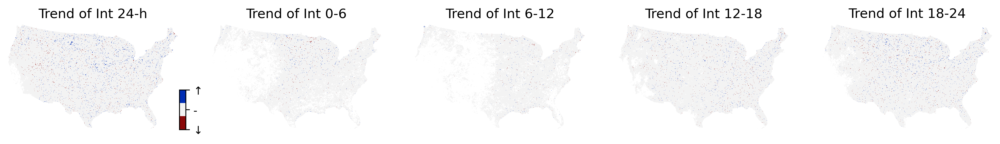

In [359]:
import matplotlib.patches as patches
titles = [ 'Trend of Int 24-h', 'Trend of Int 0-6', 
            'Trend of Int 6-12', 'Trend of Int 12-18', 
          'Trend of Int 18-24',]


# Create a (2x2) subplot grid
fig, ax = plt.subplots(1, 5, figsize=(16, 2), dpi=300)

# Plot each array in its respective subplot
arrays_ep_trend = [arr_tr_replaced['total'], arr_tr_replaced['06'], arr_tr_replaced['612'],arr_tr_replaced['1218'], arr_tr_replaced['180'],]
for i, axi in enumerate(ax.flat):
    im = axi.imshow(np.flip(arrays_ep_trend[i], axis=0), cmap=cmap2.reversed())
    axi.set_title(titles[i])
    axi.set_xticks([])
    axi.set_yticks([])
    axi.spines['top'].set_visible(False)
    axi.spines['bottom'].set_visible(False)
    axi.spines['left'].set_visible(False)
    axi.spines['right'].set_visible(False)
        # Add a single set of colored circles to each subplot

cax1 = fig.add_axes([0.26, 0.16, 0.005, 0.25])
cbar = fig.colorbar(im, cax=cax1, )

im.set_clim(vmin=-1, vmax=1)
cbar.set_ticks([-1, 0, 1])
cbar.set_ticklabels(['↓', '-', '↑'])
cbar.set_label('')

plt.show()

In [360]:
arrays_ep_pvalues = [arr_pvalues['total'], arr_pvalues['06'], arr_pvalues['612'], arr_pvalues['1218'], arr_pvalues['180']]

# Create an empty list to store the modified arrays
arr_p05 = []

# Loop through each array in arrays_ep_pvalues
for arr in arrays_ep_pvalues:
    # Use np.where to replace values greater than 0.05 with np.nan
    modified_arr = np.where(arr > 0.05, np.nan, arr)
    arr_p05.append(modified_arr)  # Append the modified array to the new list

# If you want to convert it back to a dictionary, you can use this:
arr_p05_dict = {
    'total': arr_p05[0],
    '06': arr_p05[1],
    '612': arr_p05[2],
    '1218': arr_p05[3],
    '180': arr_p05[4]
}

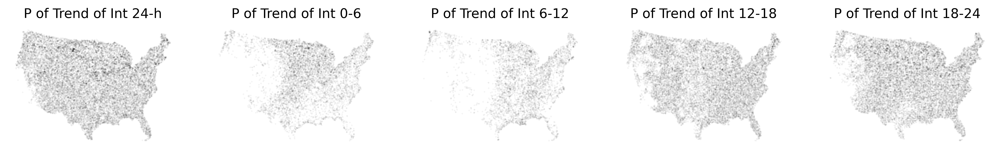

In [361]:
titles = [ 'P of Trend of Int 24-h', 'P of Trend of Int 0-6', 
            'P of Trend of Int 6-12', 'P of Trend of Int 12-18', 
          'P of Trend of Int 18-24',]

# Create a (2x2) subplot grid
fig, ax = plt.subplots(1, 5, figsize=(16, 2), dpi=500)

# Plot each array in its respective subplot
arrays_ep_pvalues = [arr_p05_dict['total'], arr_p05_dict['06'], arr_p05_dict['612'], arr_p05_dict['1218'], arr_p05_dict['180'],]
for i, axi in enumerate(ax.flat):
    y, x = np.where(~np.isnan(arrays_ep_pvalues[i]))
    im = axi.scatter(x, y, s=0.0005, color='k')
    axi.set_title(titles[i])
    axi.set_xticks([])
    axi.set_yticks([])
    axi.spines['top'].set_visible(False)
    axi.spines['bottom'].set_visible(False)
    axi.spines['left'].set_visible(False)
    axi.spines['right'].set_visible(False)

plt.show()

#### ---------------Trend of Frequency---------------

In [390]:
hourc = ds_hour_count.c.values
arr_hc_total = np.nansum(hourc,axis=1).astype(float)
arr_h06 = np.nansum(hourc[:,0:6,:,:],axis=1).astype(float)
arr_h612 =  np.nansum(hourc[:,6:12,:,:],axis=1).astype(float)
arr_h1218 =  np.nansum(hourc[:,12:18,:,:],axis=1).astype(float)
arr_h180 =  np.nansum(hourc[:,18:24,:,:],axis=1).astype(float)

mask = np.isnan(np.nanmax(ds_maxp.p.values, axis=0))
mask_reshaped = np.repeat(mask[np.newaxis, :, :], 43, axis=0)

arr_hc_total[mask_reshaped] = np.nan
arr_h06[mask_reshaped] = np.nan
arr_h612[mask_reshaped] = np.nan
arr_h1218[mask_reshaped] = np.nan
arr_h180[mask_reshaped] = np.nan

In [391]:
import numpy as np
import pymannkendall as mk  # Make sure you have the pymannkendall library

# Create a list of the arrays to process
arrays = {
    'total': arr_hc_total,
    '06': arr_h06,
    '612': arr_h612,
    '1218': arr_h1218,
    '180': arr_h180
}

# Initialize dictionaries to store results
arr_freq_trends = {}
arr_freq_pvalues = {}
arr_freq_slopes = {}

# Loop through each array in the dictionary
for key, arr in arrays.items():
    # Create empty arrays to store the results for each key
    arr_freq_trends[key] = np.empty((arr.shape[1], arr.shape[2]), dtype=object)  # For trend results
    arr_freq_pvalues[key] = np.empty((arr.shape[1], arr.shape[2]))  # For p-values
    arr_freq_slopes[key] = np.empty((arr.shape[1], arr.shape[2]))  # For slopes
    
    for i in range(arr.shape[1]):
        for j in range(arr.shape[2]):
            # Remove NaN values
            mask = ~np.isnan(arr[:, i, j])
            y_clean = arr[:, i, j][mask]
            
            # Perform Mann-Kendall test if there's enough data
            if len(y_clean) > 1:  # At least two data points are needed for the test
                result = mk.original_test(y_clean)
                trend = result.trend
                p_value = result.p
                slope = result.slope
            else:
                trend, p_value, slope = np.nan, np.nan, np.nan  # Set to NaN if insufficient data
            
            # Store the results in the respective arrays
            arr_freq_trends[key][i, j] = trend
            arr_freq_pvalues[key][i, j] = p_value
            arr_freq_slopes[key][i, j] = slope

# Now you can access the results like this:
# arr_trends['total'], arr_pvalues['total'], arr_slopes['total']
# arr_trends['06'], arr_pvalues['06'], arr_slopes['06']
# ... and so on for other keys.

In [392]:
# Initialize a dictionary to store the replaced arrays with float dtype
arr_freqtr_replaced = {}

# Loop through each key in the arr_trends dictionary
for key in arr_freq_trends.keys():
    # Replace 'no trend' with 0.0, 'increasing' with 1.0, and 'decreasing' with -1.0
    arr_freqtr_replaced[key] = np.where(arr_freq_trends[key] == 'no trend', 0.0,
                                     np.where(arr_freq_trends[key] == 'increasing', 1.0,
                                              np.where(arr_freq_trends[key] == 'decreasing', -1.0, arr_freq_trends[key]))).astype(float)

# Now you can access the replaced arrays like this:
# arr_tr_replaced['total'], arr_tr_replaced['06'], arr_tr_replaced['612'], etc.


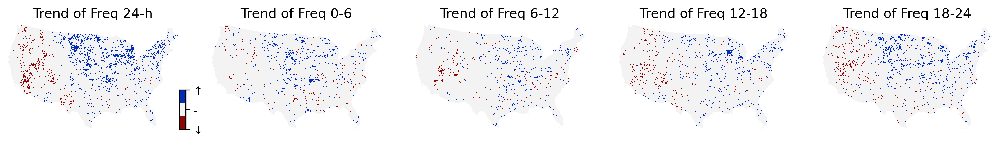

In [393]:
import matplotlib.patches as patches
titles = [ 'Trend of Freq 24-h', 'Trend of Freq 0-6', 
            'Trend of Freq 6-12', 'Trend of Freq 12-18', 
          'Trend of Freq 18-24',]


# Create a (2x2) subplot grid
fig, ax = plt.subplots(1, 5, figsize=(16, 2), dpi=300)

# Plot each array in its respective subplot
arrays_freq_trend = [arr_freqtr_replaced['total'], arr_freqtr_replaced['06'], arr_freqtr_replaced['612'],arr_freqtr_replaced['1218'], arr_freqtr_replaced['180'],]
for i, axi in enumerate(ax.flat):
    im = axi.imshow(np.flip(arrays_freq_trend[i], axis=0), cmap=cmap2.reversed())
    axi.set_title(titles[i])
    axi.set_xticks([])
    axi.set_yticks([])
    axi.spines['top'].set_visible(False)
    axi.spines['bottom'].set_visible(False)
    axi.spines['left'].set_visible(False)
    axi.spines['right'].set_visible(False)
        # Add a single set of colored circles to each subplot

cax1 = fig.add_axes([0.26, 0.16, 0.005, 0.25])
cbar = fig.colorbar(im, cax=cax1, )

im.set_clim(vmin=-1, vmax=1)
cbar.set_ticks([-1, 0, 1])
cbar.set_ticklabels(['↓', '-', '↑'])
cbar.set_label('')

plt.show()

In [394]:
arrays_freq_pvalues = [arr_freq_pvalues['total'], arr_freq_pvalues['06'], arr_freq_pvalues['612'], arr_freq_pvalues['1218'], arr_freq_pvalues['180']]

# Create an empty list to store the modified arrays
arr_p05 = []

# Loop through each array in arrays_ep_pvalues
for arr in arrays_freq_pvalues:
    # Use np.where to replace values greater than 0.05 with np.nan
    modified_arr = np.where(arr > 0.05, np.nan, arr)
    arr_p05.append(modified_arr)  # Append the modified array to the new list

# If you want to convert it back to a dictionary, you can use this:
arr_p05_dict = {
    'total': arr_p05[0],
    '06': arr_p05[1],
    '612': arr_p05[2],
    '1218': arr_p05[3],
    '180': arr_p05[4]
}

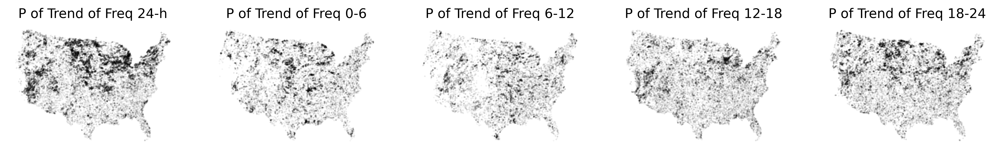

In [395]:
titles = [ 'P of Trend of Freq 24-h', 'P of Trend of Freq 0-6', 
            'P of Trend of Freq 6-12', 'P of Trend of Freq 12-18', 
          'P of Trend of Freq 18-24',]

# Create a (2x2) subplot grid
fig, ax = plt.subplots(1, 5, figsize=(16, 2), dpi=500)

# Plot each array in its respective subplot
arrays_freq_pvalues = [arr_p05_dict['total'], arr_p05_dict['06'], arr_p05_dict['612'], arr_p05_dict['1218'], arr_p05_dict['180'],]
for i, axi in enumerate(ax.flat):
    y, x = np.where(~np.isnan(arrays_freq_pvalues[i]))
    im = axi.scatter(x, y, s=0.0005, color='k')
    axi.set_title(titles[i])
    axi.set_xticks([])
    axi.set_yticks([])
    axi.spines['top'].set_visible(False)
    axi.spines['bottom'].set_visible(False)
    axi.spines['left'].set_visible(False)
    axi.spines['right'].set_visible(False)

plt.show()

### ============ Watson-William Test ===============

In [45]:
def count_eachhour(hourc, start, end):

    summed_array = np.nansum(hourc[start:end], axis=0)  # 形状为 (24, 707, 1137)
    arr = np.empty((707, 1137), dtype=object)

    for lat in range(707):
        for lon in range(1137):

            counts = summed_array[:, lat, lon]

            if np.any(counts > 0):  
                hour_indices = np.concatenate([np.full(int(count), hour) for hour, count in enumerate(counts) if count > 0])
            else:
                hour_indices = np.array([]) 
            
            arr[lat, lon] = hour_indices

    return arr

In [46]:
arr_ww1 = count_eachhour(hourc, 3, 13)

In [47]:
def convert_time_to_radians(time_data):
    radians = np.array(time_data) * 15 * (np.pi / 180)
    return radians


In [48]:
import numpy as np
from scipy.stats import f

def watson_williams_test(*args):

    groups = [np.array(group) for group in args]  
    
    n_groups = len(groups)  # 组数
    n = np.array([len(group) for group in groups])
    r = np.array([np.abs(np.mean(np.exp(1j * group))) for group in groups])  

    R = np.abs(np.mean(np.exp(1j * np.hstack(groups)))) 

    U = (2 * np.sum(n * r)) - (2 * np.sum(n) * R) 
    
    numerator = U / (n_groups - 1)
    denominator = (2 * (np.sum(n) - np.sum(n * r))) / (np.sum(n) - n_groups)
    F = numerator / denominator

    p_value = 1 - f.cdf(F, n_groups - 1, np.sum(n) - n_groups)
    
    return F, p_value

group1 = np.array([5,5,5,5,5,5,5,5,23])
group2 = np.array([5,5,5,5,5,5,5,5,5])

# 执行 Watson-Williams 测试
F_statistic, p_value = watson_williams_test(group1,group2)


In [224]:
arr_ww1 = convert_time_to_radians(count_eachhour(hourc, 0, 10))
arr_ww2 = convert_time_to_radians(count_eachhour(hourc, 10, 20))
arr_ww3 = convert_time_to_radians(count_eachhour(hourc, 20, 30))
arr_ww4 = convert_time_to_radians(count_eachhour(hourc, 30, 43))

In [225]:
arr_ww2_p = np.full((707, 1137), np.nan)
arr_ww3_p = np.full((707, 1137), np.nan)
arr_ww4_p = np.full((707, 1137), np.nan)

for i in range (707):
    for j in range(1137):
        _,arr_ww2_p[i,j] = watson_williams_test(arr_ww1[i,j],arr_ww2[i,j])
        _,arr_ww3_p[i,j] = watson_williams_test(arr_ww1[i,j],arr_ww3[i,j])
        _,arr_ww4_p[i,j] = watson_williams_test(arr_ww1[i,j],arr_ww4[i,j])
 

In [226]:
arr_ww2_p[arr_ww2_p > 0.05] = np.nan
arr_ww3_p[arr_ww3_p > 0.05] = np.nan
arr_ww4_p[arr_ww4_p > 0.05] = np.nan

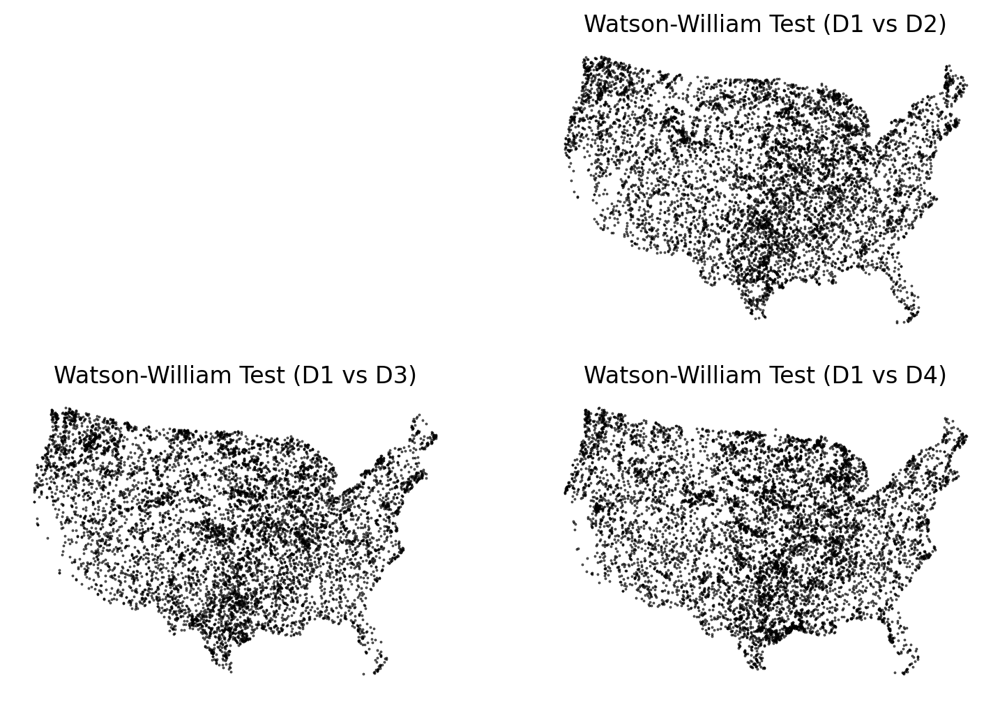

In [227]:
titles = [ 'Watson-William Test (D1 vs D2)', 'Watson-William Test (D1 vs D3)', 'Watson-William Test (D1 vs D4)' ]

# Create a (2x2) subplot grid
fig, ax = plt.subplots(2, 2, figsize=(9, 6), dpi=dpi_)

# Plot each array in its respective subplot
arrayss = [arr_cm10, arr_cm20, arr_cm30, arr_cm40]
arr_wwp = [arr_ww2_p, arr_ww3_p, arr_ww4_p]
for i, axi in enumerate(ax.flat):
    axi.axis('off')
    if i in [1,2,3]:
        axi.set_title(titles[i-1])
        y, x = np.where(~np.isnan(arr_wwp[i-1]))
        im2 = axi.scatter(x[::5], y[::5], s=0.1, color='k')

#### ww-test in different region at 4 time periods

In [49]:
import numpy as np

def expand_to_sequence(arr):
    new_arr = []
    for i, count in enumerate(arr):
        new_arr.extend([i] * int(count))  
    return np.array(new_arr)

arr_11_new = [expand_to_sequence(arr) for arr in arr_11]
arr_22_new = [expand_to_sequence(arr) for arr in arr_22]
arr_33_new = [expand_to_sequence(arr) for arr in arr_33]
arr_44_new = [expand_to_sequence(arr) for arr in arr_44]

arr_11_radians = [convert_time_to_radians(arr) for arr in arr_11_new]
arr_22_radians = [convert_time_to_radians(arr) for arr in arr_22_new]
arr_33_radians = [convert_time_to_radians(arr) for arr in arr_33_new]
arr_44_radians = [convert_time_to_radians(arr) for arr in arr_44_new]

In [50]:
p_values_arr = []

for i in range(7):  
    
    F_statistic_22, p_value_22 = watson_williams_test(arr_11_radians[i], arr_22_radians[i])
    F_statistic_33, p_value_33 = watson_williams_test(arr_11_radians[i], arr_33_radians[i])
    F_statistic_44, p_value_44 = watson_williams_test(arr_11_radians[i], arr_44_radians[i])

    p_values_arr.append([p_value_22, p_value_33, p_value_44])



In [51]:
print(p_values_arr[0]) 
print(p_values_arr[1]) 
print(p_values_arr[2]) 
print(p_values_arr[3]) 
print(p_values_arr[4]) 
print(p_values_arr[5]) 
print(p_values_arr[6]) 


[1.1102230246251565e-16, 0.390549993360085, 1.1102230246251565e-16]
[1.1102230246251565e-16, 0.6451018533593119, 1.1102230246251565e-16]
[1.1102230246251565e-16, 0.4113739543017796, 1.1102230246251565e-16]
[1.1102230246251565e-16, 1.1102230246251565e-16, 1.1102230246251565e-16]
[1.1102230246251565e-16, 1.1102230246251565e-16, 1.1102230246251565e-16]
[1.1102230246251565e-16, 1.1102230246251565e-16, 1.1102230246251565e-16]
[1.1102230246251565e-16, 1.1102230246251565e-16, 1.1102230246251565e-16]


#### ww-test in different region at 2 time periods

In [65]:
arr_before_new = [expand_to_sequence(arr) for arr in arr_before]
arr_after_new = [expand_to_sequence(arr) for arr in arr_after]


arr_before_radians = [convert_time_to_radians(arr) for arr in arr_before_new]
arr_after_radians = [convert_time_to_radians(arr) for arr in arr_after_new]

p_values_arr = []

for i in range(7):  
    
    F_statistic_ba, p_value_ba = watson_williams_test(arr_before_radians[i], arr_after_radians[i])

    p_values_arr.append([p_value_ba])


In [66]:
print(p_values_arr[0]) 
print(p_values_arr[1]) 
print(p_values_arr[2]) 
print(p_values_arr[3]) 
print(p_values_arr[4]) 
print(p_values_arr[5]) 
print(p_values_arr[6]) 

[1.1102230246251565e-16]
[1.1102230246251565e-16]
[0.7561964736644857]
[1.1102230246251565e-16]
[1.1102230246251565e-16]
[1.1102230246251565e-16]
[1.1102230246251565e-16]


#### Nighttime Percentage in Different Region
#### run line plot of frequency before run this cell

In [62]:
night_hours = list(range(18, 24)) + list(range(0, 6))
arr_night_results = []

for region in regions:
    region_data = ds_results[f'ds_{region}']
    weights = np.cos(np.deg2rad(region_data['lat']))
    night_precip_count = region_data.sel(hour=night_hours) * weights
    total_precip_count = region_data * weights
    annual_night_ratio = (night_precip_count.sum(dim=['hour', 'lat', 'lon']) /
                          total_precip_count.sum(dim=['hour', 'lat', 'lon']))
    arr_night_results.append(annual_night_ratio.c.values)


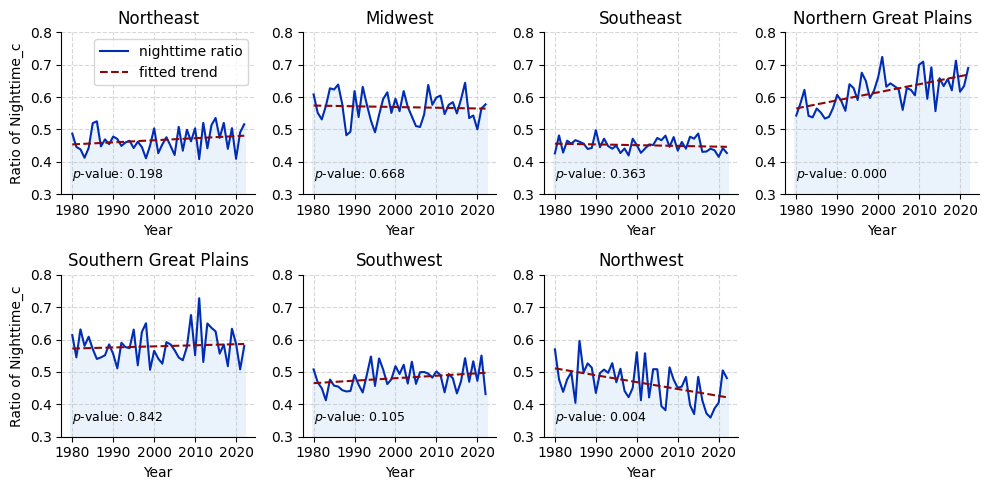

In [63]:
from scipy.stats import kendalltau
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.ticker import MaxNLocator

regions_name = ['Northeast', 'Midwest', 'Southeast', 'Northern Great Plains', 'Southern Great Plains', 'Southwest', 'Northwest']
x = np.arange(1980, 2023)
fig, axes = plt.subplots(2, 4, figsize=(10, 5), dpi=dpi_)
axes = axes.flatten()

for i in range(7):

    tau, p_value = kendalltau(x, arr_night_results[i])

    coeffs = np.polyfit(x, arr_night_results[i], 1)
    trendline = np.polyval(coeffs, x)

    axes[i].plot(x, arr_night_results[i], label='nighttime ratio', color='#002db3')
    axes[i].plot(x, trendline, label='fitted trend', linestyle='--', color='#8a0808')
    axes[i].bar(x, arr_night_results[i], width=1, alpha=0.2, color='#99c7f2')

    axes[i].set_title(f'{regions_name[i]}')
    axes[i].set_xlabel('Year')
    axes[i].set_xticks([1980, 1990, 2000, 2010, 2020])

    axes[i].set_ylim(0.3, 0.8)

    axes[i].yaxis.set_major_locator(MaxNLocator(integer=True, nbins=5))

    axes[i].spines['top'].set_visible(False)
    axes[i].spines['right'].set_visible(False)
    axes[i].grid(True, ls='--', alpha=0.5)

    axes[i].text(1980, 0.35, f'$p$-value: {p_value:.3f}', fontsize=9, color='black')
    
    if i in [0, 4]:
        axes[i].set_ylabel('Ratio of Nighttime_c')

axes[0].legend(prop={'size': 10})
axes[7].axis('off')

plt.tight_layout()
plt.show()
